In [1]:
import pandas as pd
!pip install plotly
import plotly.express as px
import seaborn as sbs
import matplotlib.pyplot as plt

In [2]:
file=pd.read_csv("country_vaccinations.csv")
file.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/


In [3]:
file.shape

(86512, 15)

In [4]:
file.columns

Index(['country', 'iso_code', 'date', 'total_vaccinations',
       'people_vaccinated', 'people_fully_vaccinated',
       'daily_vaccinations_raw', 'daily_vaccinations',
       'total_vaccinations_per_hundred', 'people_vaccinated_per_hundred',
       'people_fully_vaccinated_per_hundred', 'daily_vaccinations_per_million',
       'vaccines', 'source_name', 'source_website'],
      dtype='object')

In [5]:
file.isnull().sum()

country                                    0
iso_code                                   0
date                                       0
total_vaccinations                     42905
people_vaccinated                      45218
people_fully_vaccinated                47710
daily_vaccinations_raw                 51150
daily_vaccinations                       299
total_vaccinations_per_hundred         42905
people_vaccinated_per_hundred          45218
people_fully_vaccinated_per_hundred    47710
daily_vaccinations_per_million           299
vaccines                                   0
source_name                                0
source_website                             0
dtype: int64

#Filling all Nan Values:

In [6]:
for i in file.columns:
  if any(file[i].isnull()):
      if file[i].dtypes=='int' or file[i].dtypes=='float':
           file[i].fillna(file[i].mean(),inplace=True)
      elif file[i].dtypes=='object':
           file[i].fillna(file[i].mode().iloc[0],inplace=True)
file.isnull().sum()

country                                0
iso_code                               0
date                                   0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
daily_vaccinations_raw                 0
daily_vaccinations                     0
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
daily_vaccinations_per_million         0
vaccines                               0
source_name                            0
source_website                         0
dtype: int64

In [7]:
file=file.drop_duplicates()
file.shape

(86512, 15)

In [8]:
file.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.000000e+00,0.000000e+00,1.413830e+07,270599.578248,131305.486075,0.000000,0.000000,35.523243,3257.049157,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
1,Afghanistan,AFG,2021-02-23,4.592964e+07,1.770508e+07,1.413830e+07,270599.578248,1367.000000,80.188543,40.927317,35.523243,34.000000,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
2,Afghanistan,AFG,2021-02-24,4.592964e+07,1.770508e+07,1.413830e+07,270599.578248,1367.000000,80.188543,40.927317,35.523243,34.000000,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
3,Afghanistan,AFG,2021-02-25,4.592964e+07,1.770508e+07,1.413830e+07,270599.578248,1367.000000,80.188543,40.927317,35.523243,34.000000,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
4,Afghanistan,AFG,2021-02-26,4.592964e+07,1.770508e+07,1.413830e+07,270599.578248,1367.000000,80.188543,40.927317,35.523243,34.000000,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/


#Top 10 Countries with people fully vaccinated:

In [62]:
top_ten_countries=file.groupby('country')['people_fully_vaccinated'].sum().nlargest(10)
figure_for_top_ten_countries=px.bar(top_ten_countries,x=top_ten_countries.index,y=
top_ten_countries.values,title="Top 10 Countries With People Fully Vaccinated",template='plotly_dark')
figure_for_top_ten_countries.show()

#Count of vaccines for each number of fully vaccinated people

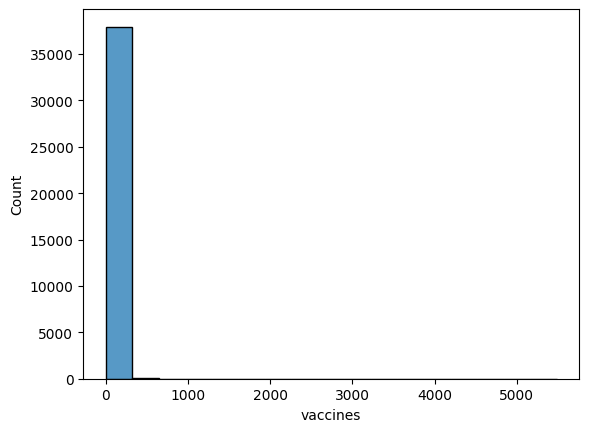

In [10]:
a=file.groupby('people_fully_vaccinated')['vaccines'].value_counts()
sbs.histplot(a)
plt.show()

#Daily Vaccination Trend:

In [66]:
figure_for_trends = px.line(file, x='date', y='daily_vaccinations', title='Daily Vaccination Trend',template='plotly_dark')
figure_for_trends.show()

#Total Vaccinations per Hundred VS People Vaccinated per Hundred

In [68]:
figure_four = px.scatter(file, x='total_vaccinations_per_hundred', y='people_vaccinated_per_hundred', color='country',
                    title='Total Vaccinations per Hundred vs. People Vaccinated per Hundred',template='plotly_dark')
figure_four.show()

#Seeing Total Vaccinations of Countries On Specific Dates:

In [70]:
figure = px.area(file, x='date', y='total_vaccinations', color='country', template='plotly_dark',title='Total Vaccinations Over Time', labels={'total_vaccinations': 'Total Vaccinations','date':"Dates"})
figure.show()

#Time Series Plot Between Date and total_vaccination to see progress:

In [71]:
figure = px.line(file,template='plotly_dark', x='date', y='total_vaccinations', color='country',title='Vaccination Progress Over Time', labels={'total_vaccinations': 'Total Vaccinations'})
figure.show()

#Comparing the vaccinations count between different countries:

In [74]:
figure = px.bar(file,x='country',y='total_vaccinations',title='Vaccination Rates by Country')
figure.update_layout(
     paper_bgcolor='cyan'
)
figure.show()

ADDING Animation of Date:

In [60]:
figure = px.bar(file, x='country', y='total_vaccinations',template='plotly_dark',title='Vaccination Progress Over Time',labels={'total_vaccinations': 'Total Vaccinations'},animation_frame='date')
figure.show()

#Pie Chart Of top 10 Vaccines Used In Different Countries:



Pfizer/BioNTech is the vaccine that is widely used in the world.

In [59]:
vaccine_counts = file['vaccines'].value_counts().reset_index()
top_ten_vaccines=vaccine_counts.nlargest(10,'vaccines')
pie_figure=px.pie(top_ten_vaccines,names='index',values='vaccines', template='plotly_dark',title='Top 10 Vaccines Accross the world')
pie_figure.show()

